In this notebook, we're going to have a CNN network "deep dream", we'll use a pretrained network here (VGG19).

In [ ]:
%tensorflow_version 2.x

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, Dropout, BatchNormalization, Activation
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing import image
from tensorflow.keras import backend as K
import tensorflow.keras.applications.vgg19 as vgg19
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
from skimage import io
from scipy.optimize import fmin_l_bfgs_b

We're going to use the same `KerasFunctionOptimizer` class we've written earlier to do the optimization for us. Since this calculates gradients and wants TensorFlow's eager execution disabled, we're just going to go ahead and disable it for the remainder of the notebook.

In [ ]:
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()

Here's the image we'll use to deep dream on. You can try experimenting with a different URL if you like.

In [ ]:
base_image_path  = 'http://mg.bluecourses.com/wp-content/uploads/2020/04/venus.jpg'

Since we use a pretrained network, we again define a function to help us preprocess an image. We're also going to define a function to deprocess an image, as we want to show it to the user.

In [ ]:
def preprocess_image(path, resize=False):
  image_original  = sk_load_img(path)
  image_processed = image_original.copy()
  if resize is not False: image_processed = image_processed.resize(resize)
  image_processed = image.img_to_array(image_processed)
  image_processed = np.expand_dims(image_processed, axis=0)
  image_processed = vgg19.preprocess_input(image_processed)
  return image_original, image_processed

In [ ]:
def deprocess_image(arr, size):
  x = np.copy(arr).reshape(size + (3, ))
  # VGG19 preprocess by normalizing each channel with the ImageNet means, so we just add these back up
  # Want to know where this comes from? See https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py#L135
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  # We also need to convert back from (blue, green, red) to (red, green, blue)
  x = x[:, :, ::-1]
  # Finally, we clip all values between 0 and 255
  x = np.clip(x, 0, 255).astype('uint8')
  return x

Let's process our image and show the original. We'll also resize the image to a smaller format.

In [ ]:
img_ncols, img_nrows = 800, 600

In [ ]:
# Helper function to read an image from an URL
def sk_load_img(url):
  return Image.fromarray(io.imread(url))

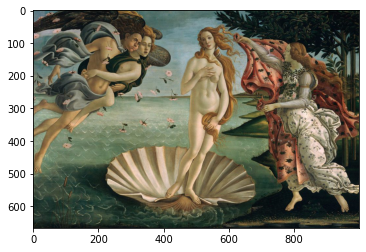

In [ ]:
base_img_original, base_img_processed = preprocess_image(base_image_path, (img_ncols, img_nrows))
plt.imshow(base_img_original); plt.show()

Next up, we're going to define a couple of loss functions we'll need later on.

In [ ]:
# Distance between neighboring pixels, without taking the border into account
def total_variation_loss(x, p=1.25):
  assert K.ndim(x) == 4
  a = K.square(x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
  b = K.square(x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
  return K.sum(K.pow(a + b, p))

# Normalized l2 loss to regularize
def l2_loss(x, l2=0.01):
  return l2 * K.sum(K.square(x))

We're now ready to define our optimizer class. We're going to write this very much in the same style as the one we used in the interpretability example.

Our situation is as follows, starting off with our original image, plus a bit of random jitter, optimize that in such a way so as to minimize the losses defined above.

In [ ]:
class DeepDreamOptimizer(object):
  def __init__(self, processed_image_shape):
    # Create our input tensor
    self.input_tensor = Input(batch_shape=processed_image_shape)
    # Pretrained model, without the top as we won't need it here
    self.model        = vgg19.VGG19(input_tensor=self.input_tensor, weights='imagenet', include_top=False)

  def configure_losses(self, losses):
    # Allow the user to configure the losses and define the Keras function
    # We can't do this in init as the user might want to use the input_tensor
    self.loss         = K.variable(0.)
    for loss in losses: self.loss = self.loss + loss
    # Calculate the gradients: loss w.r.t. the combination image
    self.gradients    = K.gradients(self.loss, self.input_tensor)
    self.outputs      = [self.loss, self.gradients]
    self.function     = K.function([self.input_tensor], self.outputs)

  def _evaluate(self, x):
    # fmin_l_bfgs_b gave us an 1d array, so we reshape x back to format of our image
    x = x.reshape(self.input_tensor.shape)
    outputs = self.function([x])
    return outputs[0], np.array(outputs[1:]).flatten().astype('float64')

  def _get_loss(self, x):
    self.last_loss, self.last_gradients = self._evaluate(x)
    return self.last_loss

  def _get_gradients(self, x):
    return np.copy(self.last_gradients)

  def optimize(self, x, **args):
    # fmin_l_bfgs_b expects a 1d array, so we flatten x
    x, min_val, info = fmin_l_bfgs_b(self._get_loss, x.flatten(), fprime=self._get_gradients, **args)
    # We also deprocess x so that the user can easily display it
    img = deprocess_image(x.copy(), (self.input_tensor.shape[1], self.input_tensor.shape[2]))
    return x, img, min_val, info

In [ ]:
optimizer = DeepDreamOptimizer(base_img_processed.shape)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
80142336/80134624 [==============================] - 1s 0us/step


Next, we define our losses:

In [ ]:
model_layers_to_output = dict([(layer.name, layer.output) for layer in optimizer.model.layers])
deep_dream_layers      = {'block5_conv1': 0.05, 'block5_conv2': 0.01}

max_activation_loss = []

for layer_name, coeff in deep_dream_layers.items():
    x     = model_layers_to_output[layer_name]
    shape = x.shape
    max_activation_loss.append(- coeff * K.sum(K.square(x[:, 2: shape[1] - 2, 2: shape[2] - 2, :])) / np.prod(shape[1:3]))

optimizer.configure_losses([
  3 * total_variation_loss(optimizer.input_tensor) / np.prod(optimizer.input_tensor.shape[:2]),
  l2_loss(optimizer.input_tensor, 0.00001)         / np.prod(optimizer.input_tensor.shape[:2]),
] + max_activation_loss)

And now we can optimize. We will do so gradually so we can show intermediate results. We'll also define the amount of jitter we want to add to start off with.

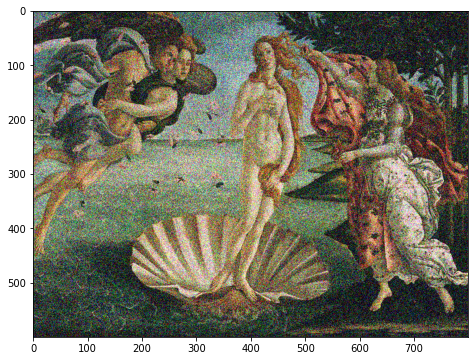

Iteration 0  loss =  10043192.0


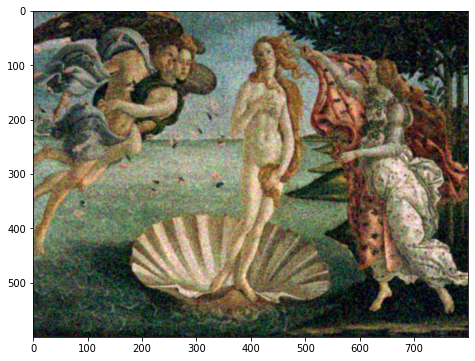

Iteration 1  loss =  1209459.0


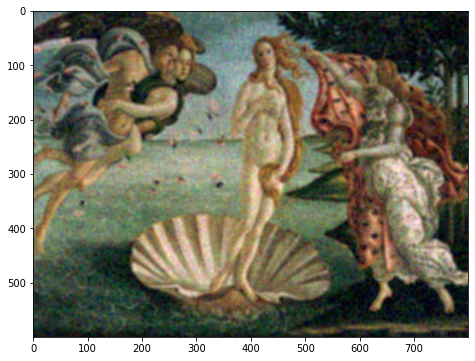

Iteration 2  loss =  -83812.23


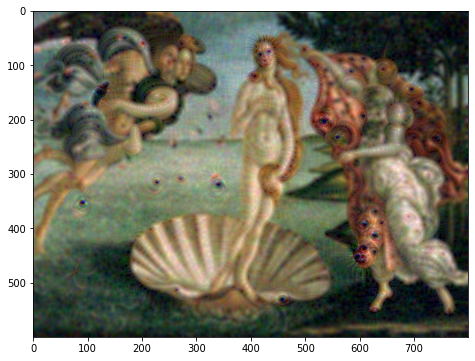

Iteration 3  loss =  -1451777.5


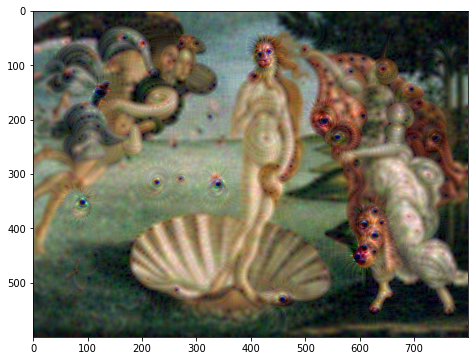

Iteration 4  loss =  -3484622.8


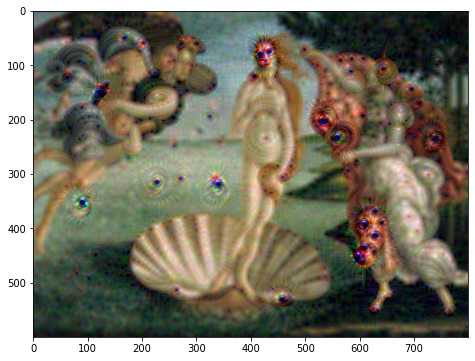

Iteration 5  loss =  -6492648.5


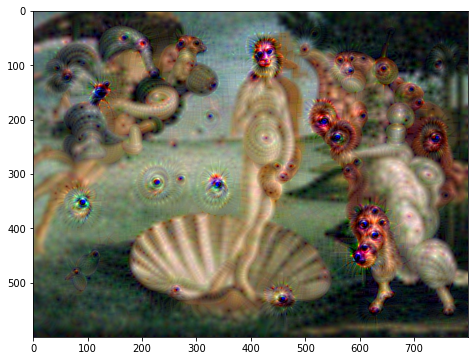

Iteration 6  loss =  -10413794.0


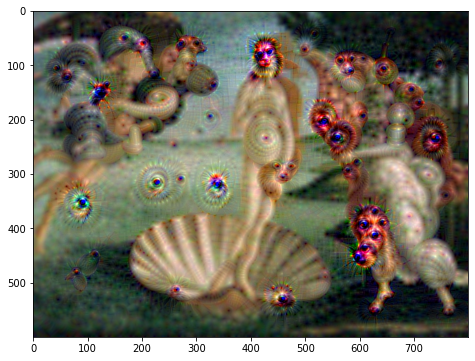

Iteration 7  loss =  -15259233.0


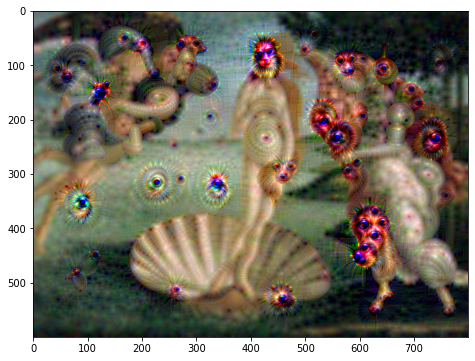

Iteration 8  loss =  -20817766.0


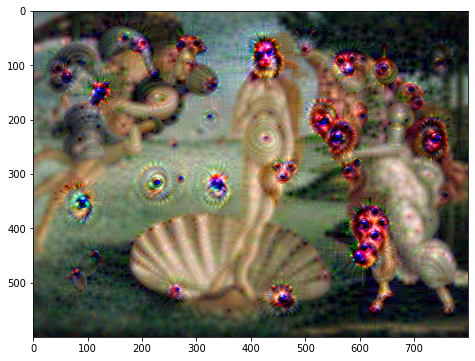

Iteration 9  loss =  -27183142.0


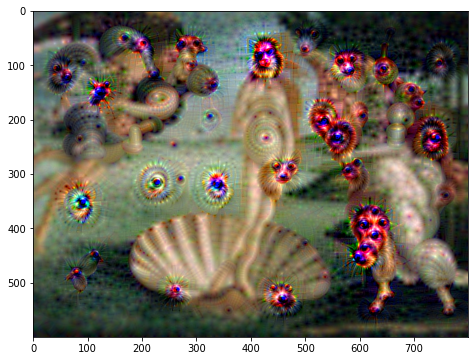

Iteration 10  loss =  -34069336.0


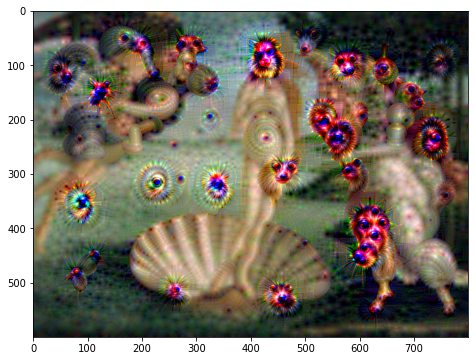

Iteration 11  loss =  -41409956.0


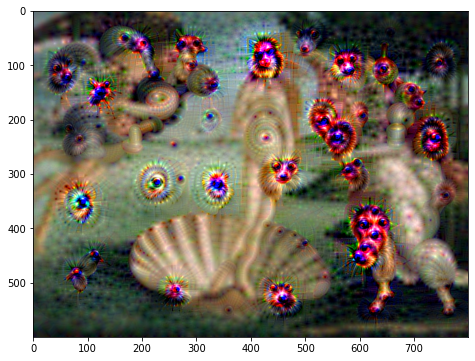

Iteration 12  loss =  -49303180.0


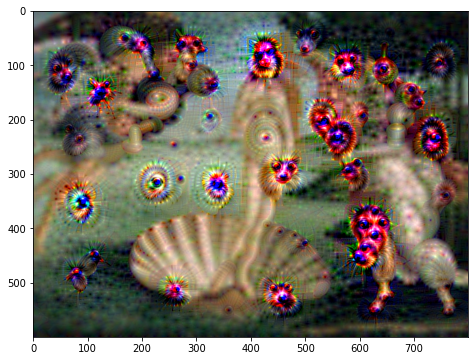

Iteration 13  loss =  -57716116.0


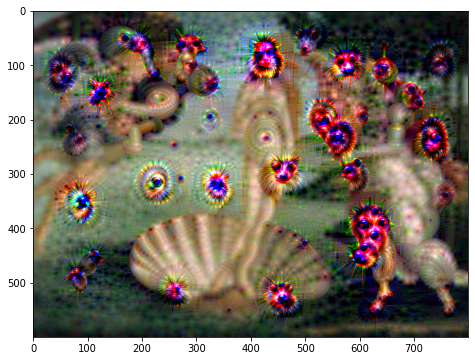

Iteration 14  loss =  -66308864.0


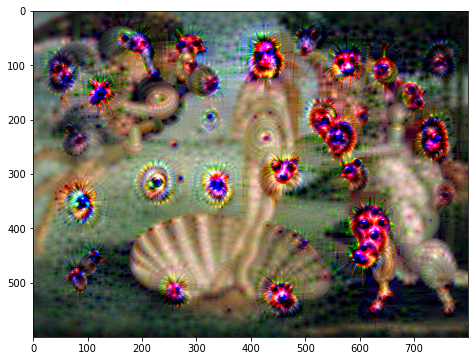

Iteration 15  loss =  -74824590.0


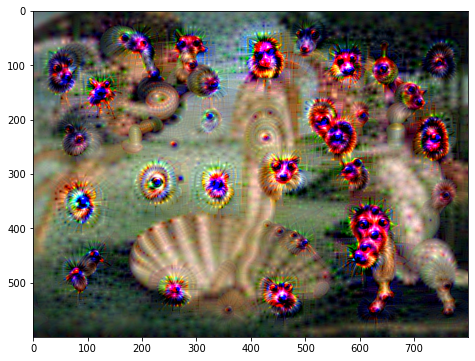

Iteration 16  loss =  -83263040.0


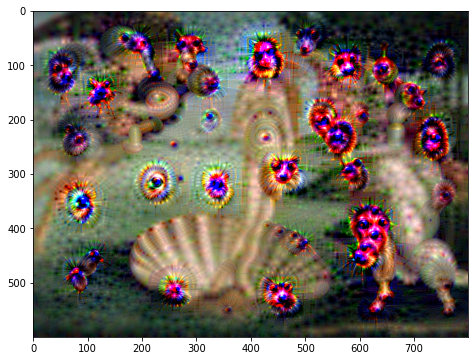

Iteration 17  loss =  -91624936.0


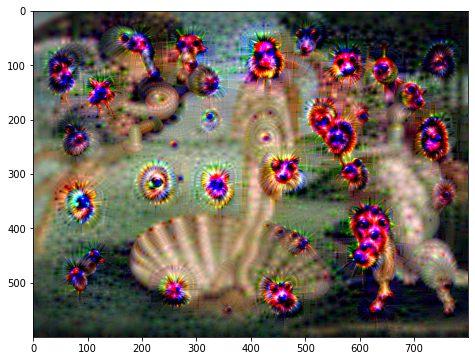

Iteration 18  loss =  -99926080.0


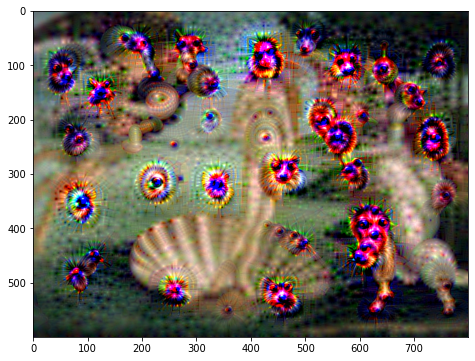

Iteration 19  loss =  -107980790.0


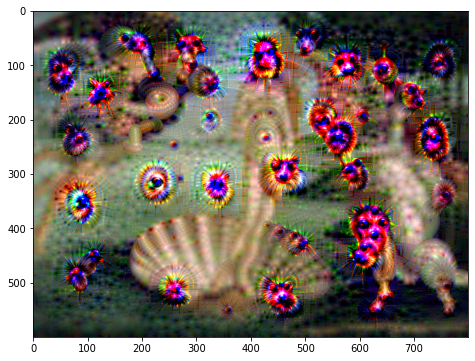

Iteration 20  loss =  -115953290.0


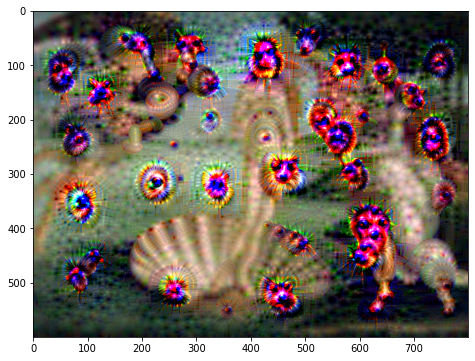

Iteration 21  loss =  -123759360.0


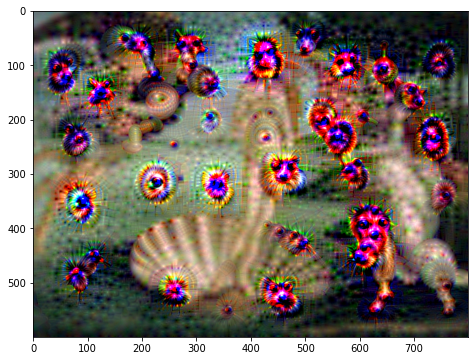

Iteration 22  loss =  -131361170.0


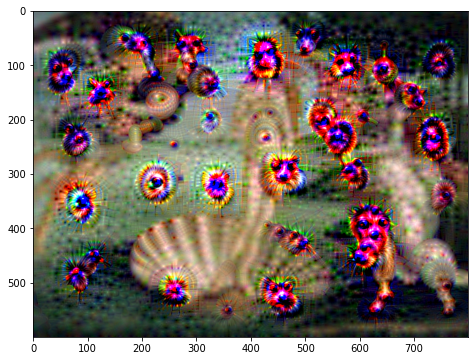

Iteration 23  loss =  -138681760.0


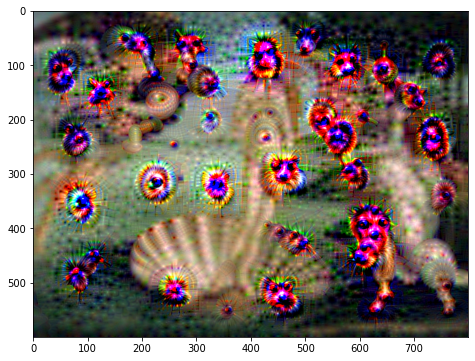

Iteration 24  loss =  -145745860.0


In [ ]:
def jitter(x, jitter_amount):
  randomness = jitter_amount * (np.random.random(x.shape) - 0.5) * 2
  return x.copy() + randomness

iterations    = 30
jitter_amount = 100
x             = jitter(base_img_processed, jitter_amount)

plt.figure(figsize=(8, 6))
plt.imshow(deprocess_image(x, (x.shape[1], x.shape[2])))
plt.show()

for i in range(iterations):
  x, img_deprocessed, min_val, info = optimizer.optimize(x, maxfun=10)
  print('Iteration', i, ' loss = ', min_val)
  plt.figure(figsize=(8, 6))
  plt.imshow(img_deprocessed)
  plt.show()
  # Add in the jitter again, less and less over the iterations (optional)
  x = jitter(x, jitter_amount / iterations)

This looks interesting: note how this network / layer has a preference to hallucinate eyes and (dog) faces. Our hallucinations are still a bit noisy (purple-ish), so you can try to play around with the loss and other hyperparameters above to see if you can get a better result.